<img src="https://raw.githubusercontent.com/inverted-ai/invertedai/master/docs/images/banner-small.png" alt="InvertedAI" width="200"/>


# General Demo
This demo will showcase some of the capabilities available in the Inverted AI API, including INITIALIZE, DRIVE, and LIGHT.

In [1]:
# Some stuff to get us going:
!pip install -I matplotlib==3.6
!pip install -I --upgrade invertedai
from IPython.display import clear_output
clear_output()

In [ ]:
import os
os.kill(os.getpid(), 9) # Runtime needs to be restarted after updating packages

In [1]:
from IPython.display import display, Image, clear_output
import matplotlib.pyplot as plt
import imageio
import numpy as np
import cv2 
import invertedai as iai
from IPython.utils import io
import time

In [2]:
#API key:
iai.add_apikey("")

## Setup

We begin by setting up the simulation and previewing some of the environment. We pick a location, a four way signalized intersection.

In [4]:
# pick a location (4 way, signalized intgersection)
location = "iai:drake_street_and_pacific_blvd"

## Preview map location

We can preview the map, and look at the traffic light locations to understand which of the lights control which road

(None, <matplotlib.image.AxesImage at 0x7fabe78b1400>)

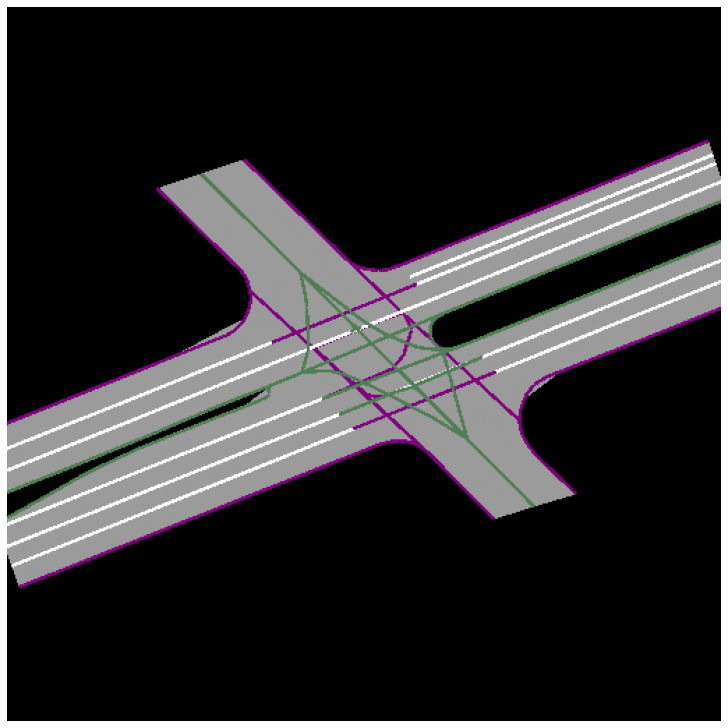

In [5]:
location_info = iai.location_info(location=location)
rendered_static_map = location_info.birdview_image.decode()
fig, ax = plt.subplots(constrained_layout=True, figsize=(10, 10))
ax.set_axis_off(), ax.imshow(rendered_static_map)

In [153]:
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
from matplotlib import animation
import numpy as np


def rot(rot):
    """Rotate in 2d"""
    return np.array([[np.cos(rot), -np.sin(rot)],
                     [np.sin(rot),  np.cos(rot)]])

class ScenePlotter:
    def __init__(self, map_image, fov, xy_offset, static_actors):
        self.map_image = map_image
        self.fov = fov
        self.extent = (- self.fov / 2 + xy_offset[0], self.fov / 2 + xy_offset[0]) + \
            (- self.fov / 2 + xy_offset[1], self.fov / 2 + xy_offset[1])

        self.traffic_lights = {static_actor.actor_id : static_actor \
                               for static_actor in static_actors \
                               if static_actor.agent_type == 'traffic-light'}

        self.traffic_light_colors = {
            'red':    (1.0, 0.0, 0.0),
            'green':  (0.0, 1.0, 0.0),
            'yellow': (1.0, 0.8, 0.0)
        }

        self.agent_c = (0.2, 0.2, 0.7)
        self.cond_c = (0.75, 0.35, 0.35)
        self.dir_c = (0.9, 0.9, 0.9)
        self.v_c = (0.2, 0.75, 0.2)

        self.dir_lines = {}
        self.v_lines = {}
        self.actor_boxes = {}
        self.traffic_light_boxes = {}
        self.box_labels = {}
        self.frame_label = None
        self.current_ax = None

        self.reset_recording()

        self.numbers = False

    def initialize_recording(self, agent_states, agent_attributes, traffic_light_states=None, conditional_agents=None):
        self.agent_states_history = [agent_states]
        self.traffic_lights_history = [traffic_light_states]
        self.agent_attributes = agent_attributes
        if conditional_agents is not None:
            self.conditional_agents = conditional_agents
        else:
            self.conditional_agents = []

    def reset_recording(self):
        self.agent_states_history = []
        self.traffic_lights_history = []
        self.agent_attributes = None
        self.conditional_agents = []

    def record_step(self, agent_states, traffic_light_states=None):
        self.agent_states_history.append(agent_states)
        self.traffic_lights_history.append(traffic_light_states)

    def plot_scene(self, agent_states, agent_attributes, traffic_light_states=None, conditional_agents=None,
                   ax=None, numbers=False, direction_vec=True, velocity_vec=False):
        self.initialize_recording(agent_states, agent_attributes,
                                  traffic_light_states=traffic_light_states,
                                  conditional_agents=conditional_agents)

        self.plot_frame(idx=0, ax=ax, numbers=numbers, direction_vec=direction_vec,
                        velocity_vec=velocity_vec, plot_frame_number=False)

        self.reset_recording()

    def plot_frame(self, idx, ax=None, numbers=False, direction_vec=False, velocity_vec=False, plot_frame_number=False):
        self._initialize_plot(ax=ax, numbers=numbers, direction_vec=direction_vec,
                              velocity_vec=velocity_vec, plot_frame_number=plot_frame_number)
        self._update_frame_to(idx)

    def animate_scene(self, output_name=None, start_idx=0, end_idx=-1, ax=None,
                      numbers=False, direction_vec=True, velocity_vec=False,
                      plot_frame_number=False):
        self._initialize_plot(ax=ax, numbers=numbers, direction_vec=direction_vec,
                              velocity_vec=velocity_vec, plot_frame_number=plot_frame_number)
        end_idx = len(self.agent_states_history) if end_idx == -1 else end_idx
        fig = self.current_ax.figure

        def animate(i):
            self._update_frame_to(i)

        ani = animation.FuncAnimation(fig, animate, np.arange(start_idx, end_idx), interval=100)
        if output_name is not None:
            ani.save(f'{output_name}', writer='pillow')
        return ani

    def _initialize_plot(self, ax=None, numbers=False, direction_vec=True, velocity_vec=False, plot_frame_number=False):
        if ax is None:
            plt.clf()
            ax = plt.gca()
        self.current_ax = ax
        ax.imshow(self.map_image, extent=self.extent)

        self.dir_lines = {}
        self.v_lines = {}
        self.actor_boxes = {}
        self.traffic_light_boxes = {}
        self.box_labels = {}
        self.frame_label = None

        self.numbers = numbers
        self.direction_vec = direction_vec
        self.velocity_vec = velocity_vec
        self.plot_frame_number = plot_frame_number

        self._update_frame_to(0)

    def _update_frame_to(self, frame_idx):
        for i, (agent, agent_attribute) in enumerate(zip(self.agent_states_history[frame_idx], self.agent_attributes)):
            self._update_agent(i, agent, agent_attribute)

        if self.traffic_lights_history[frame_idx] is not None:
            for light_id, light_state in self.traffic_lights_history[frame_idx].items():
                self._plot_traffic_light(light_id, light_state)

        if self.plot_frame_number:
            if self.frame_label is None:
                self.frame_label = self.current_ax.text(self.extent[0], self.extent[2], str(frame_idx), c='r', fontsize=18)
            else:
                self.frame_label.set_text(str(frame_idx))

        self.current_ax.set_xlim(*self.extent[0:2])
        self.current_ax.set_ylim(*self.extent[2:4])

    def _update_agent(self, agent_idx, agent, agent_attribute):
        l, w = agent_attribute.length, agent_attribute.width
        x, y = agent.center.x, agent.center.y
        v = agent.speed
        psi = agent.orientation
        box = np.array([
            [0, 0], [l * 0.5, 0], # direction vector
            [0, 0], [v * 0.5, 0], # speed vector at (0.5 m / s ) / m
        ])
        box = np.matmul(rot(psi), box.T).T + np.array([[x, y]])
        if self.direction_vec:
            if not agent_idx in self.dir_lines:
                self.dir_lines[agent_idx] = self.current_ax.plot(box[0:2,0], box[0:2,1], lw=2.0, c=self.dir_c)[0] # plot the direction vector
            else:
                self.dir_lines[agent_idx].set_xdata(box[0:2,0])
                self.dir_lines[agent_idx].set_ydata(box[0:2,1])

        if self.velocity_vec:
            if not agent_idx in self.v_lines:
                self.v_lines[agent_idx] = self.current_ax.plot(box[2:4,0], box[2:4,1], lw=1.5 , c=self.v_c)[0] # plot the speed
            else:
                self.v_lines[agent_idx].set_xdata(box[2:4,0])
                self.v_lines[agent_idx].set_ydata(box[2:4,1])
        if self.numbers:
            if not agent_idx in self.box_labels:
                self.box_labels[agent_idx] = self.current_ax.text(x, y, str(agent_idx), c='r', fontsize=18)
                self.box_labels[agent_idx].set_clip_on(True)
            else:
                self.box_labels[agent_idx].set_x(x)
                self.box_labels[agent_idx].set_y(y)

        if agent_idx in self.conditional_agents:
            c = self.cond_c
        else:
            c = self.agent_c

        rect = Rectangle((x - l / 2,y - w / 2), l, w, angle=psi * 180 / np.pi, rotation_point='center', fc=c, lw=0)
        if agent_idx in self.actor_boxes:
            self.actor_boxes[agent_idx].remove()
        self.actor_boxes[agent_idx] = rect
        self.actor_boxes[agent_idx].set_clip_on(True)
        self.current_ax.add_patch(self.actor_boxes[agent_idx])

    def _plot_traffic_light(self, light_id, light_state):
        light = self.traffic_lights[light_id]
        x, y = light.center.x, light.center.y
        psi = light.orientation
        l, w = light.length, light.width

        rect = Rectangle((x - l / 2,y - w / 2), l, w, angle=psi * 180 / np.pi,
                         rotation_point='center',
                         fc=self.traffic_light_colors[light_state], lw=0)
        if light_id in self.traffic_light_boxes: self.traffic_light_boxes[light_id].remove()
        self.current_ax.add_patch(rect)
        self.traffic_light_boxes[light_id] = rect


In [154]:
scene_plotter = ScenePlotter(rendered_static_map, location_info.map_fov, (location_info.map_center.x, location_info.map_center.y), location_info.static_actors)

These are the traffic light locations, we can infer from their coordinates which of them control what road, in the following examples we will control them  manually:

In [136]:
for actor in location_info.static_actors:
    print(actor)

actor_id=103760 agent_type='traffic-light' center=Point(x=0.883, y=-15.8905) orientation=0.7876 length=0.3421 width=3.7417 dependant=[103760]
actor_id=103761 agent_type='traffic-light' center=Point(x=-1.682, y=-13.3246) orientation=0.7876 length=0.3423 width=3.3199 dependant=[103761]
actor_id=103762 agent_type='traffic-light' center=Point(x=-4.3522, y=-10.7222) orientation=0.7876 length=0.3419 width=3.8255 dependant=[103762]
actor_id=103763 agent_type='traffic-light' center=Point(x=-7.697, y=-7.3018) orientation=0.7772 length=0.3421 width=5.5475 dependant=[103763]
actor_id=103764 agent_type='traffic-light' center=Point(x=23.2852, y=-15.506) orientation=1.9221 length=0.2903 width=8.218 dependant=[103764]
actor_id=103765 agent_type='traffic-light' center=Point(x=13.688, y=6.3305) orientation=-2.3732 length=0.3171 width=3.2149 dependant=[103765]
actor_id=103766 agent_type='traffic-light' center=Point(x=11.3971, y=8.6804) orientation=-2.3487 length=0.3177 width=3.3191 dependant=[103766]
ac

# Initializing on a controlled intersection

We are now in a position to initialize the simulation, with the above traffic light information, all we need to do is set the traffic lights appropriately. There are two main directions, and a left turn light in one direction. Our initial scenario will be a red light for the main road, and a green light for both side streets. The traffic light is passed as a dictionary.

In [105]:
main_road_light_state = 'red'
left_turn_light = 'red'
side_road_light_state = 'green'
light_states = [main_road_light_state, main_road_light_state, main_road_light_state, 
                left_turn_light,
                side_road_light_state,
                main_road_light_state, main_road_light_state, main_road_light_state,
                side_road_light_state]
traffic_light = {actor.actor_id : light for actor, light in zip(location_info.static_actors, light_states)}

Now we initialize and plot.

Note: to make this demo consistent with its pre-rendered output, we have set the random seed to a fixed number. Removing this argument will randomize the output. We have set the random seed throughout this noteboot.

Note 2: we separate plotting code and calls to the api as much as possible, to highlight the latency.

In [106]:
t0 = time.time()
initial_conditions = iai.api.initialize(location, 
                            agent_attributes = None, 
                            states_history = None, 
                            traffic_light_state_history = [traffic_light],
                            get_birdview = False, 
                            get_infractions = False, 
                            agent_count = 12, 
                            random_seed = 9999)
t0b = time.time()
print(f'Initialize time: {t0b - t0:.2f} s')

Initialize time: 1.93 s


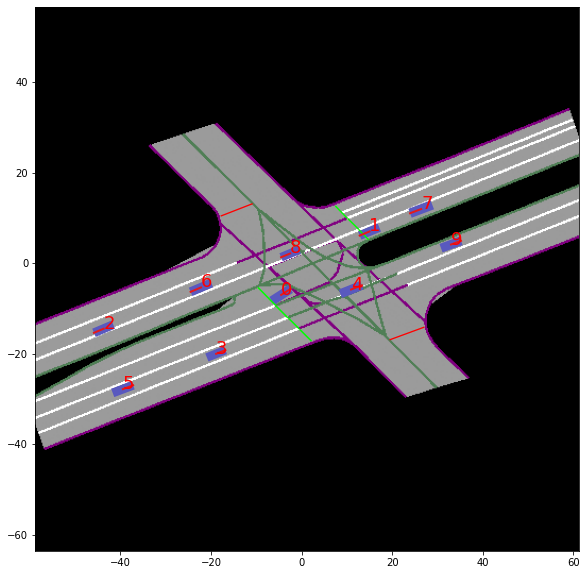

In [145]:
plt.figure(figsize=(10,10))
scene_plotter.plot_scene(initial_conditions.agent_states,
                         initial_conditions.agent_attributes, 
                         traffic_light_states = traffic_light,
                         numbers=True, velocity_vec=False, direction_vec=True)

And then we can run drive, conditioned on the traffic light state. For this example, we keep the traffic light fixed over time:

In [108]:
agent_attributes = initial_conditions.agent_attributes
scene_plotter.initialize_recording(initial_conditions.agent_states, agent_attributes=agent_attributes, traffic_light_states=traffic_light)
updated_state = initial_conditions;
times = []
for i in range(100):
    t0 = time.time()
    updated_state = iai.drive(
        agent_attributes=agent_attributes,
        agent_states=updated_state.agent_states,
        recurrent_states=updated_state.recurrent_states,
        traffic_lights_states=traffic_light,
        get_birdview=False,
        location=location,
        get_infractions=False,
    )
    t0b = time.time()
    times.append(t0b - t0)
    scene_plotter.record_step(updated_state.agent_states, traffic_light_states=traffic_light);
    print(f'Iteration {i}, api call time: {(times[-1]):.2f} s')
    clear_output(wait=True)
print(f'Average time per call: {sum(times)/len(times):.2f} over {len(times)} calls')

Average time per call: 0.13 over 100 calls


Then we assemble a gif:

In [109]:
%%capture
gif_name = 'iai-drive-side-road-green.gif'
fig, ax = plt.subplots(constrained_layout=True, figsize=(10, 10))
scene_plotter.animate_scene(output_name=gif_name, ax=ax,
                      numbers=False, direction_vec=True, velocity_vec=False,
                      plot_frame_number=True)

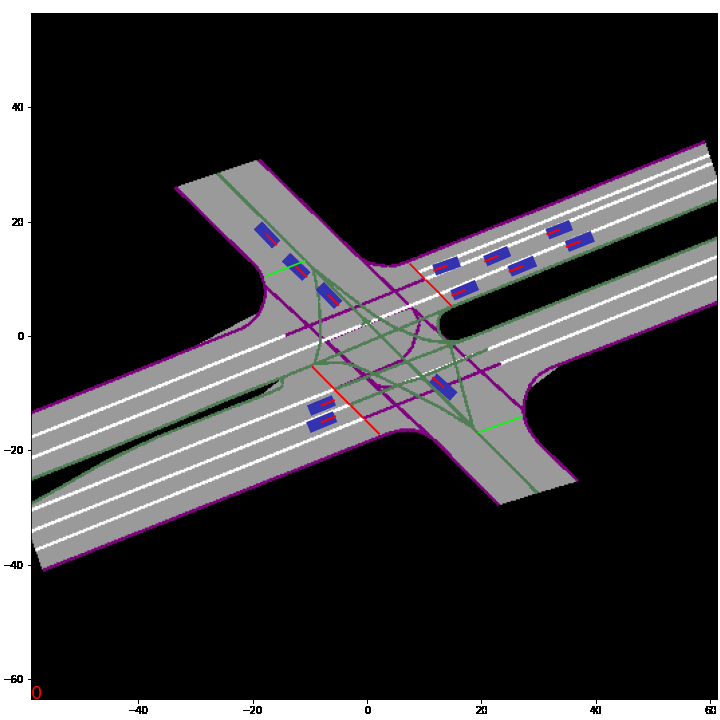

In [110]:
Image(gif_name)

Note how both initialize and ITRA correctly obey the set traffic lights: agents stop for red light, and go on green. This is also reflected in the initialized velocities, and positions.

## Alternate traffic light
To demonstrate how the model reacts to different traffic light states, we now show what happens when we initialize with an alternate traffic light state: the main road now has the green light while the side roads are red.

In [111]:
main_road_light_state = 'green'
left_turn_light = 'green'
side_road_light_state = 'red'
light_states = [main_road_light_state, main_road_light_state, main_road_light_state, 
                left_turn_light,
                side_road_light_state,
                main_road_light_state, main_road_light_state, main_road_light_state,
                side_road_light_state]
traffic_light = {actor.actor_id : light for actor, light in zip(location_info.static_actors, light_states)}

We again initialize

In [113]:
t0 = time.time()
initial_conditions = iai.api.initialize(location, 
                            agent_attributes = None, 
                            states_history = None, 
                            traffic_light_state_history = [traffic_light],
                            get_birdview = False, 
                            get_infractions = False, 
                            agent_count = 12, 
                            random_seed = 9999)
t0b = time.time()
print(f'Initialize time: {t0b - t0:.2f} s')

Initialize time: 1.99 s


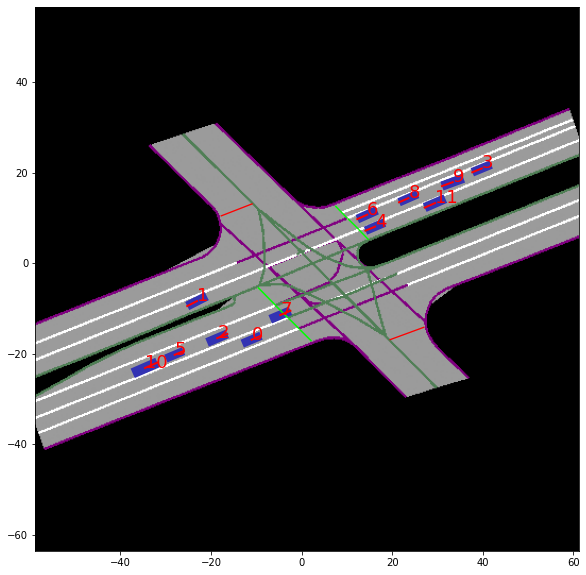

In [114]:
plt.figure(figsize=(10,10))
scene_plotter.plot_scene(initial_conditions.agent_states,
                         initial_conditions.agent_attributes, 
                         traffic_light_states = traffic_light,
                         numbers=True, velocity_vec=False, direction_vec=True)

And simulate using DRIVE:

In [115]:
agent_attributes = initial_conditions.agent_attributes
scene_plotter.initialize_recording(initial_conditions.agent_states, agent_attributes=agent_attributes, traffic_light_states=traffic_light)
updated_state = initial_conditions;
times = []
for i in range(100):
    t0 = time.time()
    updated_state = iai.drive(
        agent_attributes=agent_attributes,
        agent_states=updated_state.agent_states,
        recurrent_states=updated_state.recurrent_states,
        traffic_lights_states=traffic_light,
        get_birdview=False,
        location=location,
        get_infractions=False,
    )
    t0b = time.time()
    times.append(t0b - t0)
    scene_plotter.record_step(updated_state.agent_states, traffic_light_states=traffic_light);
    print(f'Iteration {i}, api call time: {(times[-1]):.2f} s')
    clear_output(wait=True)
print(f'Average time per call: {sum(times)/len(times):.2f} over {len(times)} calls')

Average time per call: 0.13 over 100 calls


In [116]:
%%capture
gif_name = 'iai-drive-side-road-green.gif'
fig, ax = plt.subplots(constrained_layout=True, figsize=(10, 10))
scene_plotter.animate_scene(output_name=gif_name, ax=ax,
                      numbers=False, direction_vec=True, velocity_vec=False,
                      plot_frame_number=True)

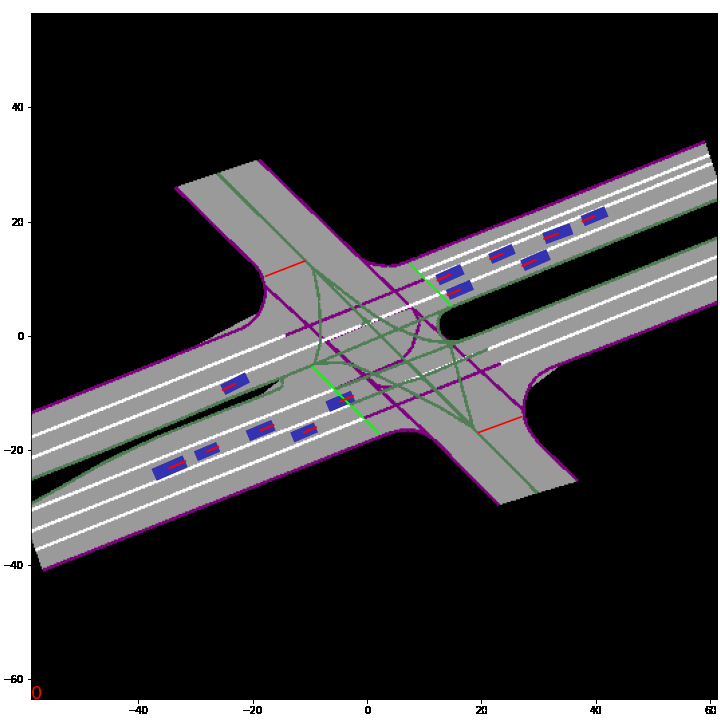

In [117]:
Image(gif_name)

## Conditional (ego) agents

In [118]:
from invertedai.common import AgentState, AgentAttributes, Point

Suppose we want to simulate a scenario of an ego vehicle taking an unprotected left turn, with a car coming from the oncoming direction. We can set up the ego agent and other agent of interest, and then generate the rest of the scene conditionally using INITIALIZE. We begin by defining the agents of interest (ego and other):

In [119]:
ego_agent_state = AgentState(center=Point(x=-4.5, y=-7.0), orientation=0.57, speed=0.02)
ego_agent_attributes = AgentAttributes(length=4.9, width=2.05, rear_axis_offset=1.57)

other_agent_state = AgentState(center=Point(x=15, y=7.0), orientation=-2.75, speed=9.57)
other_agent_attributes = AgentAttributes(length=4.68, width=1.95, rear_axis_offset=1.5)

conditional_agent_states = [ego_agent_state, other_agent_state]
conditional_agent_attributes = [ego_agent_attributes, other_agent_attributes]

Note that the speed of our left turning ego agent is close to zero, while the oncoming agent is going almost at full speed. Let's plot the conditional input to INITIALIZE before we make the API call, we use the same traffic lights as in the previous section. We also pass `conditional_agents` to the plotter to give the conditional agents a different color:

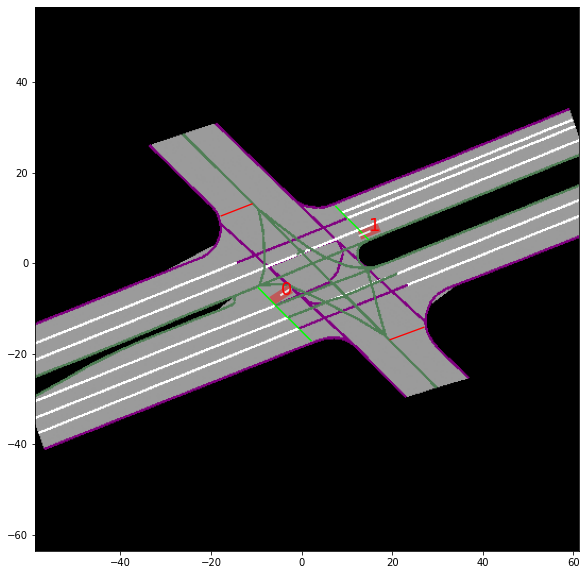

In [155]:
plt.figure(figsize=(10,10))
scene_plotter.plot_scene(conditional_agent_states,
                         conditional_agent_attributes, 
                         traffic_light_states = traffic_light,
                         conditional_agents = [0, 1],
                         numbers=True)

Then, we initialize _conditionally_ on the agents above, we spawn another ten agents, and then plot using the scene plotter:

In [127]:
t0 = time.time()
initial_conditions = iai.api.initialize(location, 
                            agent_attributes = conditional_agent_attributes, 
                            states_history = [conditional_agent_states], 
                            traffic_light_state_history = [traffic_light],
                            get_birdview = False, 
                            get_infractions = False, 
                            agent_count = 10, 
                            random_seed = 9999)
t0b = time.time()
print(f'Initialize time: {t0b - t0:.2f} s')


Initialize time: 1.79 s


We plot the resulting initial conditions with an extra keyword argument `velocity_vec`, which draws a vector in green, proportional to the speed of the agent.

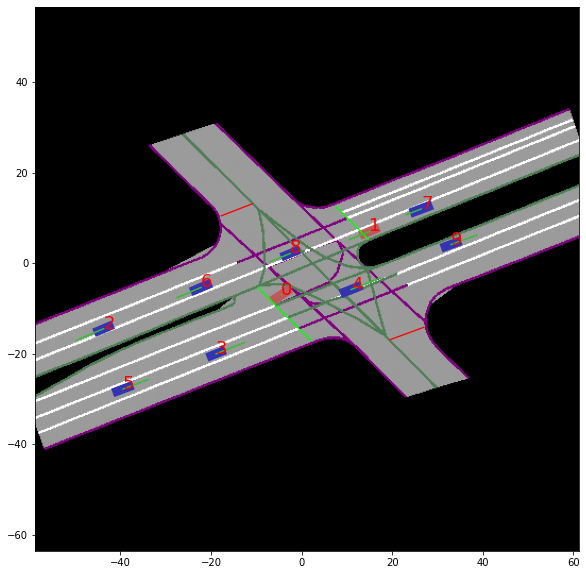

In [157]:
plt.figure(figsize=(10,10))
scene_plotter.plot_scene(initial_conditions.agent_states,
                         initial_conditions.agent_attributes, 
                         conditional_agents = [0, 1],
                         traffic_light_states = traffic_light,
                         numbers=True, velocity_vec=True, direction_vec=False)

Note that the agents in blue are consistent with the agents in red we provided ourselves. This is particularly clear when looking at the velocity vectors of each of the agents. We can now run DRIVE to simulate the unprotected turn. In this example, we use DRIVE to simulate the ego vehicle, and all other vehicles. If so desired, those other vehicles could be controlled externally.

In [129]:
agent_attributes = initial_conditions.agent_attributes
scene_plotter.initialize_recording(initial_conditions.agent_states, agent_attributes=agent_attributes, traffic_light_states=traffic_light, conditional_agents = [0, 1])
updated_state = initial_conditions;
times = []
for i in range(100):
    t0 = time.time()
    updated_state = iai.drive(
        agent_attributes=agent_attributes,
        agent_states=updated_state.agent_states,
        recurrent_states=updated_state.recurrent_states,
        traffic_lights_states=traffic_light,
        get_birdview=False,
        location=location,
        get_infractions=False,
    )
    t0b = time.time()
    times.append(t0b - t0)
    scene_plotter.record_step(updated_state.agent_states, traffic_light_states=traffic_light);
    print(f'Iteration {i}, api call time: {(times[-1]):.2f} s')
    clear_output(wait=True)
print(f'Average time per call: {sum(times)/len(times):.2f} over {len(times)} calls')

Average time per call: 0.12 over 100 calls


In [130]:
%%capture
gif_name = 'conditional-agents.gif'
fig, ax = plt.subplots(constrained_layout=True, figsize=(10, 10))
scene_plotter.animate_scene(output_name=gif_name, ax=ax,
                      numbers=False, direction_vec=True, velocity_vec=False,
                      plot_frame_number=True)

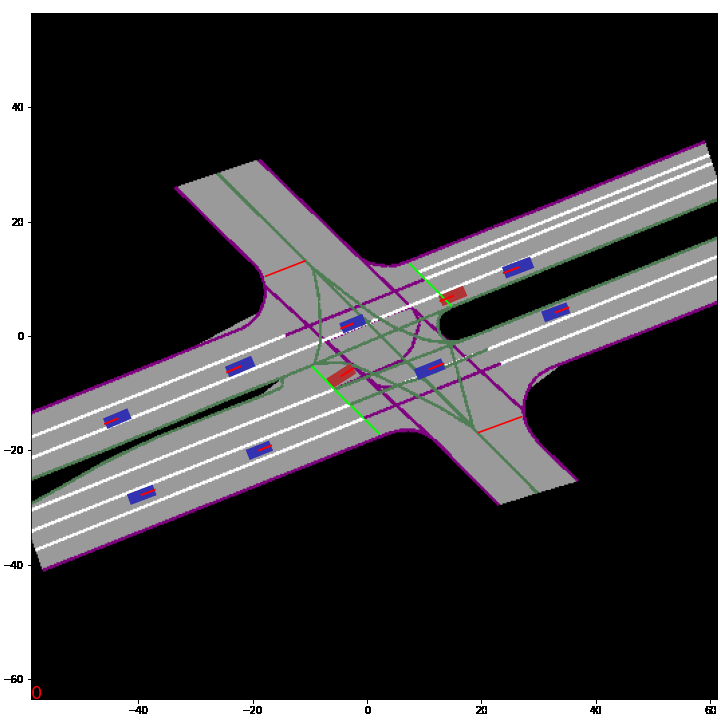

In [131]:
Image(gif_name)

Observe that the agent does not turn. This is indeed the the expected driving behavior: turning left would cause a collision. We can clear traffic by changing the traffic light state to yellow, which will give our conditional agent a chance to turn. In the section below we will explain how to use LIGHT to achieve this.

## Working with LIGHT

Using LIGHT, we have the ability to simulate traffic light states. We can use changing traffic light states combined with the previous example, to make a left turn on a yellow light. We can call the API without a previous traffic light state or a recurrent state to initialize LIGHT, and we plot the result. Note how this API simplifies all the code we needed previously to set up a controlled intersection:

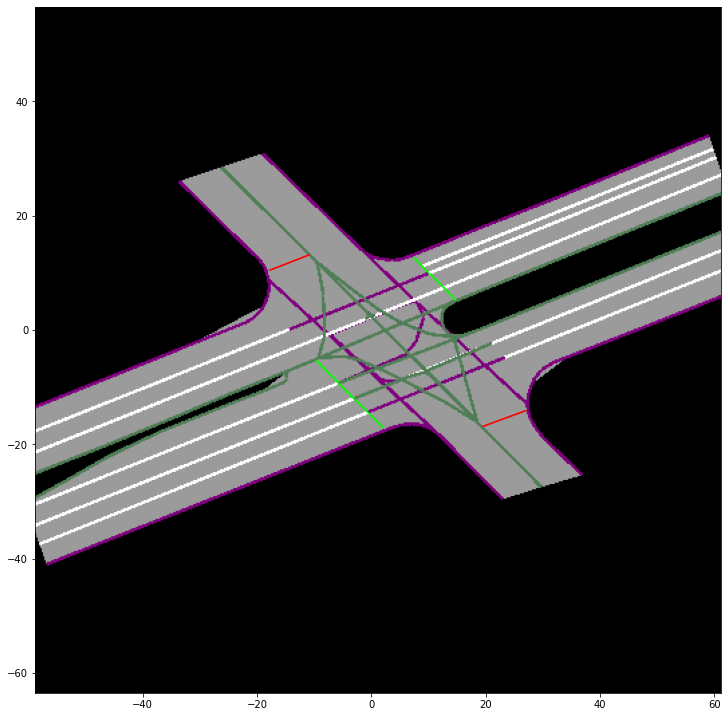

In [73]:
fig, ax = plt.subplots(constrained_layout=True, figsize=(10, 10))
light_response = iai.light(location=location, random_seed=5)
scene_plotter.plot_scene([], agent_attributes=[], traffic_light_states=light_response.traffic_lights_states, ax=ax)

We use the code below to fastforward to a point in the state machine where the light is about to turn:

In [74]:
# initialize light:
light_response = iai.light(location=location, random_seed=5)
# Fastforward to where light is about to turn yellow:
for i in range(307):
    light_response = iai.light(location=location, recurrent_states=light_response.recurrent_states)
    # print(i, light_response.traffic_lights_states[103760])
initial_light = light_response

We can now simulate the light state from this point, and make a gif of the results. Note that the traffic light changes at around 2 seconds into the simulation. This is perfect timing for our agent to make a left turn.

In [78]:
light_response = initial_light
#light_response = iai.light(location=location)
scene_plotter.initialize_recording(agent_states=[], agent_attributes=[], traffic_light_states=light_response.traffic_lights_states)
times = []
for i in range(100):
    t0 = time.time()
    light_response = iai.light(location=location, recurrent_states=light_response.recurrent_states)
    t0b = time.time()
    times.append(t0b - t0)
    scene_plotter.record_step(updated_state.agent_states, traffic_light_states=light_response.traffic_lights_states);
    print(f'Iteration {i}, api call time: {(times[-1]):.2f} s')
    clear_output(wait=True)
print(f'Average time per call: {sum(times)/len(times):.2f} over {len(times)} calls')    

Average time per call: 0.04 over 100 calls


In [76]:
%%capture
gif_name = 'traffic-light-states.gif'
fig, ax = plt.subplots(constrained_layout=True, figsize=(10, 10))
scene_plotter.animate_scene(output_name=gif_name, ax=ax,
                      numbers=False, direction_vec=True, velocity_vec=False,
                      plot_frame_number=True)

(Note the frame number in the bottom left corner to see when the gif loops, causing the traffic light state to jump)

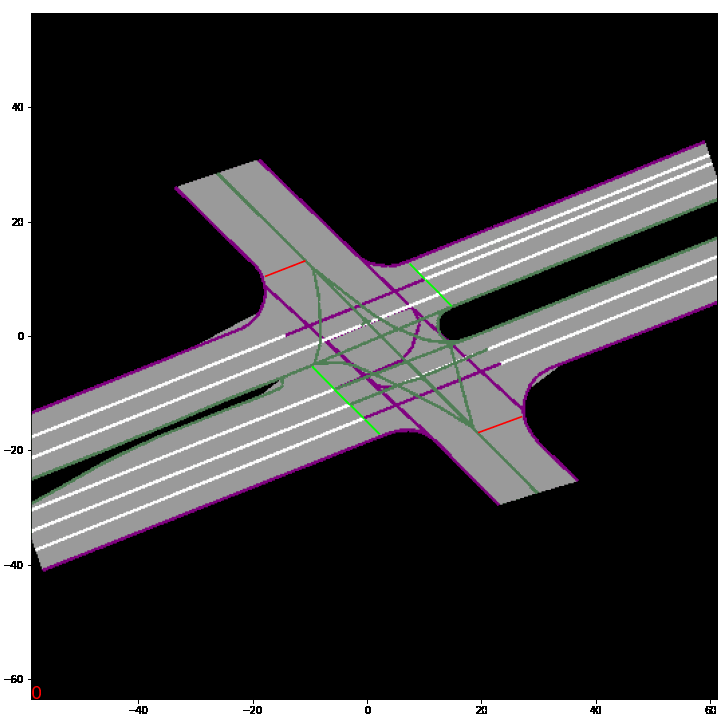

In [77]:
Image(gif_name)

## Putting it all together

We can now put the whole thing together, and generate initial conditions based on our custom traffic light, and run drive with updating traffic light states. We re-use the conditional agents from before, as well as the initial light state from the previous section, then generate initial conditions and plot:

In [79]:
initial_conditions = iai.api.initialize(location, 
                            agent_attributes = conditional_agent_attributes, 
                            states_history = [conditional_agent_states], 
                            traffic_light_state_history = [initial_light.traffic_lights_states],
                            get_birdview = False, 
                            get_infractions = False, 
                            agent_count = 12, 
                            random_seed = 1234)

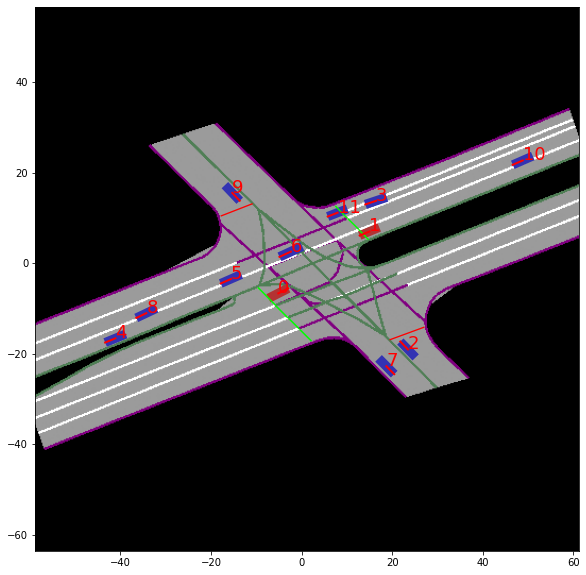

In [80]:
plt.figure(figsize=(10,10))
scene_plotter.plot_scene(initial_conditions.agent_states,
                         initial_conditions.agent_attributes, 
                         conditional_agents = [0, 1],
                         traffic_light_states = traffic_light,
                         numbers=True)

We can now run DRIVE, while running LIGHT, to simulate the rest of the scenario:

In [81]:
agent_attributes = initial_conditions.agent_attributes
light_response = initial_light

scene_plotter.initialize_recording(initial_conditions.agent_states, agent_attributes=agent_attributes, traffic_light_states=light_response.traffic_lights_states, conditional_agents = [0, 1])
updated_state = initial_conditions
times = []
for i in range(150):
    t0 = time.time()
    light_response = iai.light(location=location, recurrent_states=light_response.recurrent_states)
    updated_state = iai.drive(
        agent_attributes=agent_attributes,
        agent_states=updated_state.agent_states,
        recurrent_states=updated_state.recurrent_states,
        traffic_lights_states=traffic_light,
        get_birdview=False,
        location=location,
        get_infractions=False,
    )
    t0b = time.time()
    times.append(t0b - t0)
    scene_plotter.record_step(updated_state.agent_states, traffic_light_states=light_response.traffic_lights_states);
    print(f'Iteration {i}, api call time: {(times[-1]):.2f} s')
    clear_output(wait=True)
print(f'Average time per call: {sum(times)/len(times):.2f} over {len(times)} calls')

Average time per call: 0.16 over 150 calls


In [82]:
%%capture
gif_name = 'conditional-agents-and-lights.gif'
fig, ax = plt.subplots(constrained_layout=True, figsize=(10, 10))
scene_plotter.animate_scene(output_name=gif_name, ax=ax,
                      numbers=False, direction_vec=True, velocity_vec=False,
                      plot_frame_number=True)

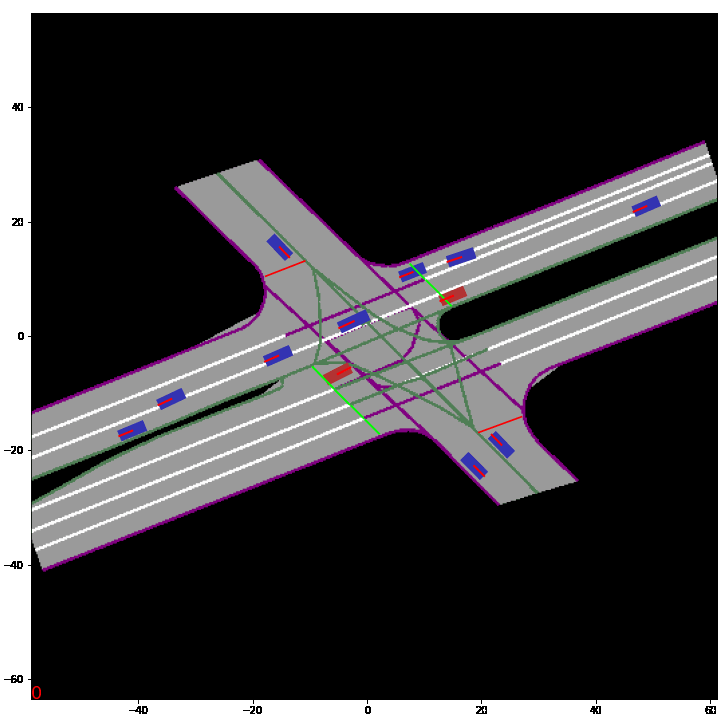

In [83]:
Image(gif_name)